In [6]:
#Imports
import pandas as pd
from sklearn.naive_bayes import GaussianNB
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.ensemble import RandomForestClassifier
import skfuzzy as fuzz 
from skfuzzy import control as ctrl 

import statistics
from scipy.signal import find_peaks

In [7]:
#Loads data for training, testing and system information
df = pd.read_csv('data/local_reduced.csv', sep=',', header=None)
synth_df = pd.read_csv('data/synth_data.csv', sep=',', header=None)
test = pd.read_csv('data/test_data.csv', sep=',', header=None)
system_df = pd.read_csv('data/kepinfo.csv', sep=',', header=0)
kepid = system_df["kepid"]
koiname = system_df["kepoi_name"]

In [8]:
df = df.sample(frac=1).reset_index(drop=True)
synth_df = synth_df.sample(frac=1).reset_index(drop=True)

#Splits and normalises all local data
x_train = df.drop([0, 1, 2], axis=1)
x_train_norm = []
for i, row in x_train.iterrows():
    row_norm = (row-min(row))/(max(row)-min(row))
    x_train_norm.append(row_norm)
x_train_norm = pd.DataFrame(x_train_norm)
type_train = df[2]
y_train = df[0]
label_train = df[1]
x_train_norm.columns = range(x_train_norm.shape[1])

#Splits and normalises all synthetic data
synth_x_train = synth_df.drop([0], axis=1)
synth_x_train_norm = []
for i, row in synth_x_train.iterrows():
    row_norm = (row-min(row))/(max(row)-min(row))
    synth_x_train_norm.append(row_norm)
synth_x_train_norm = pd.DataFrame(synth_x_train_norm)
synth_y_train = synth_df[0]
synth_x_train_norm.columns = range(synth_x_train_norm.shape[1])

#Merges synthetic data with local data
x_frames = [synth_x_train_norm, x_train_norm]
x_train_all = pd.concat(x_frames)
y_frames = [synth_y_train, y_train]
y_train_all = pd.concat(y_frames)

#Splits test data
x_test = test
print(x_test)

        0         1         2         3         4         5         6    \
0  0.988604  0.989079  0.991453  0.992403  0.994302  0.994302  0.994302   
1  0.981383  0.982048  0.984043  0.984375  0.986702  0.986702  0.989362   
2  0.981137  0.983850  0.984496  0.985013  0.987080  0.987080  0.987080   

        7         8         9    ...       190       191       192       193  \
0  0.994658  0.997151  0.997151  ...  0.977208  0.976733  0.974359  0.974359   
1  0.991356  0.992021  0.992354  ...  0.994681  0.994681  0.994681  0.994681   
2  0.987080  0.987080  0.985530  ...  0.992506  0.992248  0.992248  0.992248   

        194       195       196       197       198       199  
0  0.974359  0.974359  0.972934  0.971510  0.971035  0.968661  
1  0.994681  0.993351  0.992021  0.992021  0.992021  0.992021  
2  0.992248  0.992248  0.992248  0.990633  0.988049  0.986111  

[3 rows x 200 columns]


In [9]:
#Defines model
gnb = GaussianNB()
gnb.fit(x_train_norm, y_train)

test_pred = gnb.predict(x_test)

D:\Python\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

D:\Python\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

D:\Python\lib\site-packages\skfuzzy\control\fuzzyvariable.py:122: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



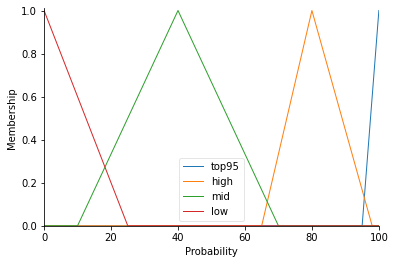

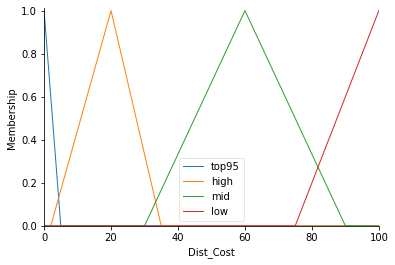

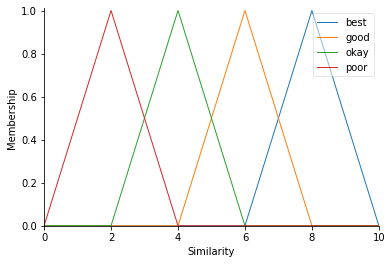

In [10]:
probability = ctrl.Antecedent(np.arange(0, 101, 1), 'Probability')
probability['top95'] = fuzz.trimf(probability.universe, [95, 100, 100])
probability['high'] = fuzz.trimf(probability.universe, [65, 80, 98])
probability['mid'] = fuzz.trimf(probability.universe, [10, 40, 70])
probability['low'] = fuzz.trimf(probability.universe, [0, 0, 25])

dist_cost = ctrl.Antecedent(np.arange(0, 101, 1), 'Dist_Cost')
dist_cost['top95'] = fuzz.trimf(dist_cost.universe, [0, 0, 5])
dist_cost['high'] = fuzz.trimf(dist_cost.universe, [2, 20, 35])
dist_cost['mid'] = fuzz.trimf(dist_cost.universe, [30, 60, 90])
dist_cost['low'] = fuzz.trimf(dist_cost.universe, [75, 100, 100])

similarity = ctrl.Consequent(np.arange(0, 11, 1), 'Similarity')
similarity['best'] = fuzz.trimf(similarity.universe, [6, 8, 10])
similarity['good'] = fuzz.trimf(similarity.universe, [4, 6, 8])
similarity['okay'] = fuzz.trimf(similarity.universe, [2, 4, 6])
similarity['poor'] = fuzz.trimf(similarity.universe, [0, 2, 4])

probability.view()
dist_cost.view()
similarity.view()

In [11]:
#Defines rules for top95 probability
toprule1 = ctrl.Rule(probability['top95'] & dist_cost['top95'], similarity['best'])
toprule2 = ctrl.Rule(probability['top95'] & dist_cost['high'], similarity['good'])
toprule3 = ctrl.Rule(probability['top95'] & dist_cost['mid'], similarity['good'])
toprule4 = ctrl.Rule(probability['top95'] & dist_cost['low'], similarity['okay'])

#Defines rules for high probability
highrule1 = ctrl.Rule(probability['high'] & dist_cost['top95'], similarity['good'])
highrule2 = ctrl.Rule(probability['high'] & dist_cost['high'], similarity['good'])
highrule3 = ctrl.Rule(probability['high'] & dist_cost['mid'], similarity['okay'])
highrule4 = ctrl.Rule(probability['high'] & dist_cost['low'], similarity['okay'])

#Defines rules for mid probability
midrule1 = ctrl.Rule(probability['mid'] & dist_cost['top95'], similarity['good'])
midrule2 = ctrl.Rule(probability['mid'] & dist_cost['high'], similarity['okay'])
midrule3 = ctrl.Rule(probability['mid'] & dist_cost['mid'], similarity['okay'])
midrule4 = ctrl.Rule(probability['mid'] & dist_cost['low'], similarity['poor'])

#Defines rules for low probability
lowrule1 = ctrl.Rule(probability['low'] & dist_cost['top95'], similarity['okay'])
lowrule2 = ctrl.Rule(probability['low'] & dist_cost['high'], similarity['okay'])
lowrule3 = ctrl.Rule(probability['low'] & dist_cost['mid'], similarity['poor'])
lowrule4 = ctrl.Rule(probability['low'] & dist_cost['low'], similarity['poor'])

similarity_threshold = ctrl.ControlSystem([toprule1, toprule2, toprule3, toprule4, 
                                           highrule1, highrule2, highrule3, highrule4, 
                                           midrule1, midrule2, midrule3, midrule4, 
                                           lowrule1, lowrule2, lowrule3, lowrule4])
similarity_simulation = ctrl.ControlSystemSimulation(similarity_threshold)

In [12]:
#Searches for LC based on ID
def lc_search(search_id):
    print(search_id)
    result = ""
    found = False
    for i in range(len(kepid)):
        if kepid[i] == search_id:
            found = True
            result = koiname[i]
    if found == False:
        print("target not found")
    return result

In [13]:
#Calculates euclidean distance
def euclidean_distance(target):
    target = np.array(target)
    dist = []
    for i, row in x_train_norm.iterrows():
        a = target
        b = row
        print("A")
        print(a)
        print("B")
        print(b)
        ED = np.linalg.norm(a-b)
        dist.append(ED)
    return dist

In [14]:
##Fill DTW Matrix
def fill_dtw_cost_matrix(s1, s2):
    s1 = s1.to_numpy()
    s2 = s2.to_numpy()
    l_s_1, l_s_2 = len(s1), len(s2)
    cost_matrix = np.zeros((l_s_1+1, l_s_2+1))
    for i in range(l_s_1+1):
        for j in range(l_s_2+1):
            cost_matrix[i, j] = np.inf
    cost_matrix[0, 0] = 0
    
    for i in range(1, l_s_1+1):
        for j in range(1, l_s_2+1):
            cost = abs(s1[i-1] - s2[j-1])
            #take last min from the window
            prev_min = np.min([cost_matrix[i-1, j], cost_matrix[i, j-1], cost_matrix[i-1, j-1]])
            cost_matrix[i, j] = cost + prev_min
            
    overall_cost = 0
    for x in cost_matrix:
        y = min(x)
        overall_cost = overall_cost + y
    return overall_cost

In [15]:
prob = pd.DataFrame(gnb.predict_log_proba(x_test))
classes = pd.DataFrame(gnb.classes_)
euclid = pd.DataFrame()

In [16]:
def plot_similar(first, second):
    plt.figure(figsize=(10,5))
    plt.plot(first)
    plt.plot(second)
    plt.show()

In [17]:
def create_link(search_id):
    link = "https://exoplanetarchive.ipac.caltech.edu/overview/" + lc_search(int(search_id))
    return link

In [18]:
def search_df(search_id):
    for data_index, row in df.iterrows():
        if row[0] == int(search_id):
            similar_lc = x_train_norm.iloc[data_index]
    return similar_lc

In [19]:
def fuzzy_simulation(prob_all):
    similarity = []
    for all_index, all_row in prob_all.iterrows():
        similarity_simulation.input['Probability'] = all_row['prob']
        similarity_simulation.input['Dist_Cost'] = all_row['dist_cost']
        similarity_simulation.compute()
        
        # Output the result
        sim = similarity_simulation.output['Similarity']
        similarity.append(sim)
        
    return similarity

In [20]:
def compare_predicted(test):
    cost = euclidean_distance(test)
    cost = (cost-min(cost))/(max(cost)-min(cost))*100
    cost = pd.Series(cost)
    print(cost)
    return cost

In [21]:
def get_light_curve(sort, ascend, test_lc, data):
    final_sorted = data.sort_values(sort, ascending=ascend)
    top = final_sorted[:1]
    search_id = (top['kepid']).to_string(index=False)
    print(search_id)
    lc = search_df(search_id)
    print(top)
    print(create_link(search_id))
    plot_similar(test_lc, lc)

In [22]:
for prob_index, prob_row in prob.iterrows():
    dist_cost = compare_predicted(x_test.iloc[prob_index])
    prob_row = (prob_row-min(prob_row))/(max(prob_row)-min(prob_row))*100
    
    dist_cost = pd.concat([dist_cost, y_train], axis=1)
    dist_cost.columns = ['dist_cost','kepid']
    dist_cost = dist_cost.sort_values('kepid', ascending=True).reset_index(drop=True)
    print(dist_cost)
    prob_all = pd.concat([prob_row, dist_cost], axis=1)
    prob_all.columns = ['prob', 'dist_cost','kepid']
    #Defines similarity and concatenates with all data
    similarity = fuzzy_simulation(prob_all)
    similarity = pd.Series(similarity)
    final_sim = pd.concat([prob_all, similarity], axis=1)
    final_sim.columns = ['prob', 'dist_cost','kepid', 'similarity']
    
    test_lc = x_test.iloc[prob_index]
    
    get_light_curve('prob', False, test_lc, final_sim)
    get_light_curve('dist_cost', True, test_lc, final_sim)
    get_light_curve('similarity', False, test_lc, final_sim)
    #ALTER FUZZY LOGIC AND MAKE IT SO YOU CAN TEST ONE LC AT A TIME AND THEN YOUR DONE!

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.658119

Name: 177, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-0

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

Name: 388, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-0

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.740530
1      0.784207
2      0.816782
3      0.752600
4      0.889829
         ...   
195    0.871023
196    0.875250
197    0.832220
198    0.774777
199    0.823710
Name: 568, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.677818
1      0.733550
2      0.695157
3      0.502147
4      0.740829
         ...   
195    0.684317
196    0.650007
197    0.198040
198    0.451377
199    0.606600
Name: 646, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.928136
1      0.876989
2      0.925565
3      0.847146
4      0.892417
         ...   
195    0.999037
196    0.953277
197    0.999976
198    0.975483
199    0.926790
Name: 699, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0      0.758298
1      0.809598
2      0.529918
3      0.573856
4      0.683127
         ...   
195    0.674860
196    0.602985
197    0.524666
198    0.599173
199    0.771620
Name: 1115, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97

B
0      0.430694
1      0.753956
2      1.000000
3      0.421342
4      0.432449
         ...   
195    0.577660
196    0.554513
197    0.506790
198    0.572588
199    0.580197
Name: 1193, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.303465
1      0.480225
2      0.283227
3      0.320686
4      0.486209
         ...   
195    0.480431
196    0.782939
197    0.650679
198    0.379392
199    0.919777
Name: 1373, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9

0      0.878665
1      0.886878
2      0.872845
3      0.837228
4      0.902624
         ...   
195    0.875926
196    0.875926
197    0.831783
198    0.986828
199    0.853302
Name: 1415, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.683563
1      0.648765
2      0.388704
3      0.769977
4      0.457303
         ...   
195    0.514378
196    0.547936
197    0.389759
198    0.554850
199    0.487670
Name: 1514, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.560311
1      0.750065
2      0.567597
3      0.719863
4      0.614117
         ...   
195    0.677763
196    0.698657
197    0.658842
198    0.780324
199    0.693559
Name: 1651, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.753185
1      0.513491
2      0.333547
3      0.530542
4      0.735020
         ...   
195    0.486928
196    0.524027
197    0.639503
198    0.478636
199    0.482772
Name: 1730, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9

B
0      0.429338
1      0.591263
2      0.656679
3      0.593550
4      0.584169
         ...   
195    0.655509
196    0.790452
197    0.702121
198    0.525428
199    0.362494
Name: 1781, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.555904
1      0.641563
2      0.743705
3      0.795678
4      0.578344
         ...   
195    0.723915
196    0.708449
197    0.487969
198    0.823144
199    0.634143
Name: 1934, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




0      0.637257
1      0.799452
2      0.803196
3      0.896714
4      0.786261
         ...   
195    0.522664
196    0.720653
197    0.655765
198    0.441388
199    0.709429
Name: 2325, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.9

0      0.855031
1      0.952460
2      0.888682
3      0.905101
4      0.851093
         ...   
195    0.921435
196    0.871372
197    0.881954
198    0.886905
199    0.900628
Name: 2398, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97

0      0.625463
1      0.406079
2      0.592003
3      0.611803
4      0.905529
         ...   
195    0.608140
196    0.598705
197    0.587716
198    0.716905
199    0.642946
Name: 2471, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97

Name: 2547, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-

Name: 2603, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

0      0.774917
1      0.709452
2      0.668037
3      0.830032
4      0.773101
         ...   
195    0.769754
196    0.863880
197    0.878791
198    0.876909
199    0.889982
Name: 2820, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97

B
0      0.656758
1      0.716067
2      0.724540
3      0.732019
4      0.657249
         ...   
195    0.771891
196    0.715569
197    0.739495
198    0.729524
199    0.719556
Name: 2885, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.614992
1      0.602921
2      0.226071
3      0.438041
4      0.456619
         ...   
195    0.317053
196    0.373702
197    0.579218
198    0.419593
199    0.404248
Name: 2943, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9

A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.94301994e-01 9.93352327e-01 9.91452991e-01
 9.89553656e-01 9.88129155e-01 9.85754986e-01 9.84805318e-01
 9.82905983e-01 9.80531814e-01 9.78632479e-01 9.75783476e-01
 9.72459639e-01 9.6581

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.634971
1      0.792621
2      0.700666
3      0.777643
4      0.831389
         ...   
195    0.653830
196    0.632601
197    0.573469
198    0.797715
199    0.504165
Name: 3055, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.861667
1      0.923148
2      0.881704
3      0.933442
4      0.794973
         ...   
195    0.836969
196    0.787018
197    0.855904
198    0.887398
199    0.816382
Name: 3103, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9

 9.72934473e-01 9.71509972e-01 9.71035138e-01 9.68660969e-01]
B
0      0.710797
1      1.000000
2      0.710797
3      0.705210
4      0.710797
         ...   
195    0.710797
196    0.710797
197    0.750096
198    0.710797
199    0.710797
Name: 3151, Length: 200, dtype: float64
A
[9.88603989e-01 9.89078822e-01 9.91452991e-01 9.92402659e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94658120e-01
 9.97150997e-01 9.97150997e-01 9.98575499e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.96438746e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.91927825e-01 9.91452991e-01 9.91452991e-01 9.91452991e-01
 9.93945869e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.94301994e-01 9.94301994e-01 9.94301994e-01 9.94301994e-01
 9.96082621e-01 9.97150997e-01 9.97150997e-01 9.97150997e-01
 9.97150997e-01 9.97150997e-01 9.97150997e-01 9

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

